#### 02: Spatial Analytics

This notebook analyses the spatial and spatio-temporal structure of Chicago taxi demand.

The workflow covers the following steps:

1. **H3 discretization:** Chicago is tessellated with H3 hexagons at resolutions 6, 7 and 8 to provide a flexible grid for spatial aggregation. The grid combines trip-centroid cells with a full geographic fill so zero-demand areas within the city boundary are still represented.
2. **Spatial demand choropleth:** Total pickup demand is mapped onto the H3 grid to identify high-demand zones and visualise how resolution affects spatial granularity.
3. **Temporal demand profiles:** Citywide demand is broken down by hour of day, day of week, month and weekday vs. weekend to characterise the temporal rhythm of taxi usage.
4. **Spatio-temporal demand:** Pickup demand is mapped at H3 resolution 7 for each 4-hour time bucket, revealing how hotspot locations shift throughout the day.
5. **Net flow analysis:** Pickups minus dropoffs per hexagon and time bucket shows where demand is generated versus absorbed, with direct implications for fleet repositioning.
6. **Origin-destination matrix:** An OD heatmap over the top 10 pickup and dropoff community areas quantifies the dominant travel corridors in the network.
7. **Profitability mapping:** Profit rate ($/hr), fare per mile and fare per minute are computed per hexagon and time bucket to identify where and when drivers earn most efficiently.
8. **KDE and GMM hotspot detection:** A kernel density surface and a BIC-optimal Gaussian mixture model locate the structural pickup hotspots across the city.

In [175]:
import pandas as pd
import numpy as np
import geopandas as gpd
import h3
import json
import os
from pathlib import Path
from shapely.geometry import Point, shape, mapping, Polygon
from shapely.ops import unary_union

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.patches import Patch
from matplotlib.colors import LinearSegmentedColormap
import matplotlib
import matplotlib.cm as cm
import seaborn as sns

# ── colour palette (consistent throughout notebook) ──────────────────────────
PALETTE      = 'YlOrRd'          # unchanged
BG_COLOR     = '#ffffff'
FIG_COLOR    = '#ffffff'
TEXT_COLOR   = '#000000'
BORDER_COLOR = '#000000'         # community area boundaries
GRAY_MISSING = '#cccccc'         # empty / no-data hexagons

sns.set_theme(style='whitegrid', palette='muted')
plt.rcParams.update({
    'figure.facecolor': BG_COLOR,
    'axes.facecolor': FIG_COLOR,
    'axes.labelcolor': TEXT_COLOR,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'xtick.color': TEXT_COLOR,
    'ytick.color': TEXT_COLOR,
    'xtick.labelsize': 13,
    'ytick.labelsize': 13,
    'text.color': TEXT_COLOR,
    'axes.titlecolor': TEXT_COLOR,
    'legend.fontsize': 14,
    'grid.color': '#d9d9d9',
    'figure.dpi': 130,
})

# ── paths ──────────────────────────────────────────────────────────────────
# Make scripts/ importable
path = os.getcwd()
while ".git" not in os.listdir(path):
    path = os.path.dirname(path)
ROOT_DIR = Path(path)
os.chdir(ROOT_DIR)

GEOJSON_PATH = ROOT_DIR / 'data' / 'raw' / 'community_areas.geojson'   # adjust if needed
OUTPUT_DIR   = ROOT_DIR / 'data' / 'raw'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── H3 resolutions to analyse ─────────────────────────────────────────────
H3_RESOLUTIONS = [6, 7, 8]   # extend as desired, e.g. [6, 7, 8, 9]

#### Load and Prepare Data

We load the cleaned taxi trips through the shared `load_taxi_data` loader (see `scripts/helpers/datasets.py`), then build a slim working frame, `df_demand`, with only the columns needed for spatial and temporal aggregation. Keeping it slim is what makes the groupbys below fast on the full ~6.6M-row dataset. Trips are also bucketed into 4-hour windows here, and the community area polygons are loaded now since they are needed both for the H3 boundary fill in the next step and for the origin-destination analysis later on.

In [176]:
from scripts.helpers.datasets import load_taxi_data
df = load_taxi_data(preprocessed=True)
df.head(2)

,trip_id,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,dropoff_community_area,...,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,date,hour,day_of_week,is_weekend,week,month,is_holiday
0,22208de57c456e7e6ea5f60bdc1746ad300535a9,04b96cbbdcfe5b7cbb6884bc1b922819466f652662ead8...,2024-01-01 00:00:00-06:00,2024-01-01 00:30:00-06:00,2214,18.23,17031980000,17031320100,76.0,32.0,...,-87.90304,41.884987,-87.620993,2024-01-01,0,0,False,1,1,True
1,3c05ccf0732fc338b7c875f9a9779039eaada274,0cbf5c0f6aca3628d77c7b6fe89715757ed402a70b0f8b...,2024-01-01 00:00:00-06:00,2024-01-01 00:30:00-06:00,1681,15.34,17031980000,17031071400,76.0,7.0,...,-87.90304,41.922083,-87.634156,2024-01-01,0,0,False,1,1,True


In [177]:
# Timestamps are already clean (NaT dropped, community areas filled, zero-trips removed)
# by preprocess_taxi_data(). We only need to parse dtypes + derive temporal features.

# df_demand: slim dataframe with only demand-relevant columns
# df is kept as-is but not actively used in this notebook
DEMAND_COLS = [
    'trip_id','taxi_id',
    'trip_start_timestamp','trip_end_timestamp',
    'pickup_community_area',  'dropoff_community_area',
    'pickup_centroid_latitude',  'pickup_centroid_longitude',
    'dropoff_centroid_latitude', 'dropoff_centroid_longitude',
    'fare', 'tips', 'trip_seconds', 'trip_miles', 'date', 'hour', 
    'day_of_week', 'week', 'month', 'is_weekend'
]

df_demand = df[DEMAND_COLS].copy()


df_demand = df_demand.dropna(subset=['trip_start_timestamp'])

WEEKDAYS = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]  # index 0 = Monday

df_demand["day_name"] = pd.Categorical.from_codes(
    df_demand["day_of_week"], categories=WEEKDAYS, ordered=True
)

# 4-hour buckets
bins_4h   = [-1, 3, 7, 11, 15, 19, 23]
labels_4h = ['Night(0-3)', 'Early Morning(4-7)', 'Morning(8-11)',
              'Afternoon(12-15)', 'Evening(16-19)', 'Night(20-23)']
df_demand['bucket_4h'] = pd.cut(df_demand['hour'], bins=bins_4h, labels=labels_4h)
# Cast to Int16 before mapping to avoid float/int key mismatch in area_name_dict
df_demand['pickup_community_area']  = df_demand['pickup_community_area'].astype('Int16')
df_demand['dropoff_community_area'] = df_demand['dropoff_community_area'].astype('Int16')
df_demand['trip_total'] = df_demand['fare'] + df_demand['tips'].fillna(0)

display(df_demand.head())

# ── Load Community Areas GeoJSON ──────────────────────────────────────────
# set CRS to WGS84 (EPSG:4326) so that it matches the lat/lon coordinate system of taxi data (& H3 hexagons)
gdf_communities = gpd.read_file(GEOJSON_PATH).set_crs('EPSG:4326', allow_override=True)
# .read_file returns area  numbers as strings, need for a int, as the spatial join of the hexagons with the community areas (need: both ints)
gdf_communities['area_numbe'] = gdf_communities['area_numbe'].astype(int)
print(f'Community areas: {len(gdf_communities)} polygons  |  CRS: {gdf_communities.crs}')
display(gdf_communities.head())

,trip_id,taxi_id,trip_start_timestamp,trip_end_timestamp,pickup_community_area,dropoff_community_area,pickup_centroid_latitude,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,...,trip_miles,date,hour,day_of_week,week,month,is_weekend,day_name,bucket_4h,trip_total
0,22208de57c456e7e6ea5f60bdc1746ad300535a9,04b96cbbdcfe5b7cbb6884bc1b922819466f652662ead8...,2024-01-01 00:00:00-06:00,2024-01-01 00:30:00-06:00,76,32,41.979071,-87.903040,41.884987,-87.620993,...,18.23,2024-01-01,0,0,1,1,False,Monday,Night(0-3),56.16
1,3c05ccf0732fc338b7c875f9a9779039eaada274,0cbf5c0f6aca3628d77c7b6fe89715757ed402a70b0f8b...,2024-01-01 00:00:00-06:00,2024-01-01 00:30:00-06:00,76,7,41.979071,-87.903040,41.922083,-87.634156,...,15.34,2024-01-01,0,0,1,1,False,Monday,Night(0-3),48.60
2,63d8c865c01bde9e17e469db6a30e33c8cfe5314,259d38cfdbc9ac6f9bb01f0df740e0ddf4a631a70bbdd6...,2024-01-01 00:00:00-06:00,2024-01-01 00:00:00-06:00,8,8,41.892508,-87.626215,41.899156,-87.626211,...,0.30,2024-01-01,0,0,1,1,False,Monday,Night(0-3),4.25
3,ddcd4d6b7c138bee6841a7800cfbb45f31e6101a,0fdab9be71f6d88e3d3a2e115afc5a33d2bf74153792c5...,2024-01-01 00:00:00-06:00,2024-01-01 00:45:00-06:00,76,32,41.979071,-87.903040,41.884987,-87.620993,...,17.44,2024-01-01,0,0,1,1,False,Monday,Night(0-3),61.80
4,01915a9c38422a0b41e3c9920a769925bafa1b1a,6c6bb220c0c5f895374a902ce390b95a3f928b11f7f7e5...,2024-01-01 00:15:00-06:00,2024-01-01 00:30:00-06:00,3,8,41.958056,-87.660389,41.895033,-87.619711,...,5.93,2024-01-01,0,0,1,1,False,Monday,Night(0-3),22.20


Community areas: 77 polygons  |  CRS: EPSG:4326


,community,shape_area,area_num_1,area_numbe,shape_len,geometry
0,ROGERS PARK,51259902.4506,1,1,34052.3975757,"MULTIPOLYGON (((-87.65456 41.99817, -87.65574 ..."
1,WEST RIDGE,98429094.8621,2,2,43020.6894583,"MULTIPOLYGON (((-87.68465 42.01948, -87.68464 ..."
2,UPTOWN,65095642.7289,3,3,46972.7945549,"MULTIPOLYGON (((-87.64102 41.9548, -87.644 41...."
3,LINCOLN SQUARE,71352328.2399,4,4,36624.6030848,"MULTIPOLYGON (((-87.67441 41.9761, -87.6744 41..."
4,NORTH CENTER,57054167.85,5,5,31391.6697542,"MULTIPOLYGON (((-87.67336 41.93234, -87.67342 ..."


#### H3 Discretization

Chicago's footprint is tessellated with H3 hexagons at multiple resolutions. The grid is built in two steps:

1. **Trip-centroid cells**: every hexagon that contains at least one pickup or dropoff coordinate is included, so no trip is silently excluded.
2. **Geographic fill**: all H3 cells that intersect the union of Chicago's 77 community area polygons are added on top. This ensures the grid covers the full city boundary, not just areas with observed trips.

The second step is necessary because the dataset stores census-tract centroids rather than raw GPS coordinates. All trips within the same census tract collapse to a single point, which maps to only one H3 cell at fine resolutions. Without the geographic fill, neighbouring cells inside the same tract would appear as holes in choropleth maps even though they are valid, populated parts of the city. Cells added by the fill but with no trips receive a demand of zero.

(Resolution 5: only utilized in prediction, not in spatial analytics)

| Res | Avg area | Scale |
|:---:|---:|---|
| 5 | ~252.9 km² | City-wide zone | 
| 6 | ~36.1 km² | District |
| 7 | ~5.2 km² | Neighbourhood |
| 8 | ~0.74 km² | Block-level |

In [178]:
def build_h3_grid_from_trips(df: pd.DataFrame, resolution: int,
                              boundary_gdf: gpd.GeoDataFrame = None) -> gpd.GeoDataFrame:
    """
    Build an H3 grid for a given resolution.

    Starts from hexagons that hold at least one pickup or dropoff centroid,
    then (when boundary_gdf is supplied) adds every cell that intersects the
    geographic boundary so that zero-demand areas are still rendered.
    """
    pickup_col  = f'pickup_h3_r{resolution}'
    dropoff_col = f'dropoff_h3_r{resolution}'
    all_hex_ids = set(df[pickup_col].dropna()) | set(df[dropoff_col].dropna())

    if boundary_gdf is not None:
        chicago_union = unary_union(boundary_gdf.geometry)
        geo_cells = h3.geo_to_cells(mapping(chicago_union), resolution)
        all_hex_ids |= set(geo_cells)

    print(f'  Resolution {resolution} -> {len(all_hex_ids):,} hexagons')

    rows = []
    for hexID in all_hex_ids:
        boundary = h3.cell_to_boundary(hexID)
        poly = Polygon([(lon, lat) for lat, lon in boundary])
        lat, lon = h3.cell_to_latlng(hexID)
        rows.append({'h3_id': hexID, 'geometry': poly, 'centroid_lat': lat, 'centroid_lon': lon})

    return gpd.GeoDataFrame(rows, crs='EPSG:4326')

Following helpers for the Assignment of Trips to H3 cells.

In [179]:
from scripts.helpers.spatial import add_h3_cells


print('Assigning trips to H3 cells ...')
for res in H3_RESOLUTIONS:
    add_h3_cells(df_demand, res)  # in-place, no copy

# Build H3 grids — geographic boundary fills in zero-demand cells so plots
# show a complete Chicago footprint rather than data-driven holes.
print('\nBuilding H3 grids from trip centroids + Chicago boundary ...')
h3_grids = {}
for res in H3_RESOLUTIONS:
    h3_grids[res] = build_h3_grid_from_trips(df_demand, res, boundary_gdf=gdf_communities)

# Add col: community name from pickup/dropoff_community_area, as taxi data only contained community area number
# Set area_numbe as index and community (name) as value
# map() matches the key (area_numbe) with the community area, and returns community name for each trip
area_name_dict = gdf_communities.set_index('area_numbe')['community'].to_dict()
df_demand['pickup_community_name']  = df_demand['pickup_community_area'].map(area_name_dict)
df_demand['dropoff_community_name'] = df_demand['dropoff_community_area'].map(area_name_dict)



# Prints
# Result Added: Cols with hexID & community name of the pickup/dropoff for each trip
print(f'\nTotal trips with H3 assignment: {len(df_demand):,}')
df_demand[[f'pickup_h3_r{r}' for r in H3_RESOLUTIONS] +
          ['pickup_community_name', 'hour', 'bucket_4h']].head()

Assigning trips to H3 cells ...

Building H3 grids from trip centroids + Chicago boundary ...
  Resolution 6 -> 27 hexagons
  Resolution 7 -> 129 hexagons
  Resolution 8 -> 819 hexagons

Total trips with H3 assignment: 5,891,622


,pickup_h3_r6,pickup_h3_r7,pickup_h3_r8,pickup_community_name,hour,bucket_4h
0,862759347ffffff,87275934effffff,88275934edfffff,OHARE,0,Night(0-3)
1,862759347ffffff,87275934effffff,88275934edfffff,OHARE,0,Night(0-3)
2,862664c1fffffff,872664c1effffff,882664c1e1fffff,NEAR NORTH SIDE,0,Night(0-3)
3,862759347ffffff,87275934effffff,88275934edfffff,OHARE,0,Night(0-3)
4,862664d8fffffff,872664c16ffffff,882664c16dfffff,UPTOWN,0,Night(0-3)


#### Visualisation - H3 Grid over Chicago (According to Res)

C:\Users\Louis Schreier\AppData\Local\Temp\ipykernel_21688\264750851.py:40: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 1, 0.70, 0.95])


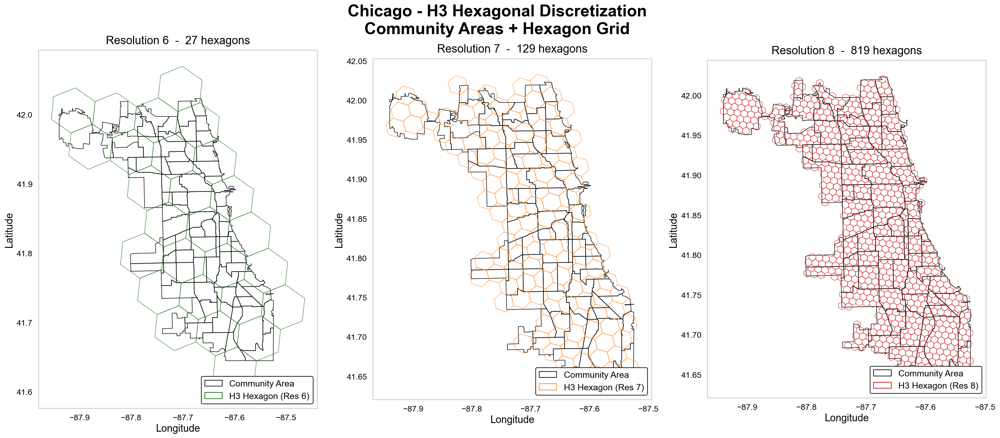

Figure saved ✓


In [180]:
n_res = len(H3_RESOLUTIONS)
fig, axes = plt.subplots(1, n_res, figsize=(9 * n_res, 14), facecolor=BG_COLOR)
if n_res == 1:
    axes = [axes]

fig.suptitle('Chicago - H3 Hexagonal Discretization\nCommunity Areas + Hexagon Grid',
             fontsize=26, fontweight='bold', color=TEXT_COLOR, y=0.85)

hex_colors = ['#006400', '#ff7f0e', '#cc0000']  # eine Farbe pro Resolution

for ax, res, hex_color in zip(axes, H3_RESOLUTIONS, hex_colors):
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)

    gdf_communities.plot(
        ax=ax, facecolor='none', edgecolor=BORDER_COLOR,
        linewidth=0.9, alpha=0.9
    )

    gdf_hex = h3_grids[res]
    gdf_hex.plot(
        ax=ax, facecolor='none', edgecolor=hex_color,
        linewidth=0.6, alpha=0.9
    )

    ax.set_title(f'Resolution {res}  -  {len(gdf_hex):,} hexagons',
                 fontsize=18, color=TEXT_COLOR, pad=10)
    ax.set_xlabel('Longitude', fontsize=16)
    ax.set_ylabel('Latitude',  fontsize=16)
    ax.tick_params(labelsize=13)

    legend_elements = [
        Patch(facecolor='none', edgecolor=BORDER_COLOR, label='Community Area'),
        Patch(facecolor='none', edgecolor=hex_color,     label=f'H3 Hexagon (Res {res})')
    ]
    ax.legend(handles=legend_elements, loc='lower right', fontsize=14,
              framealpha=1.0, facecolor=FIG_COLOR, labelcolor=TEXT_COLOR,
              edgecolor=BORDER_COLOR)

plt.tight_layout(rect=[0, 1, 0.70, 0.95])
plt.savefig(OUTPUT_DIR / 'h3_grid_chicago.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()
print('Figure saved ✓')

The three panels confirm the grid scales as expected: 27 hexagons at resolution 6, 129 at resolution 7, and 819 at resolution 8. The separate cluster of hexagons in the northwest is O'Hare, which sits outside Chicago's contiguous footprint but is still covered thanks to the geographic fill described above.

#### Helpers for Choropleth Color Scales

In [181]:
def compute_choropleth_colors(values, vmax=None, cmap_name=PALETTE, gamma=0.1, zero_color=None):
    """Normalise values to [0,1] with power transform and map to hex colours.
    Zero values receive zero_color instead of the bottom of the colormap.
    """
    cmap = plt.get_cmap(cmap_name)
    vmax = vmax or values.max()
    zero_color = zero_color or mcolors.to_hex(cmap(0.0))
    norm = (values.clip(upper=vmax) / vmax) ** gamma
    return pd.Series(
        [zero_color if orig == 0 else mcolors.to_hex(cmap(n))
         for orig, n in zip(values, norm)],
        index=values.index
    )

def add_colorbar(ax, vmax, cmap_name=PALETTE, label='Trip Count',
                 orientation='vertical', ticks=None, pad=0.02, cax=None, shrink=0.6):
    """Add a colorbar with ticks shown on the original (un-normalised) scale."""
    ticks = ticks or [0, 0.1, 0.25, 0.5, 0.75, 1.0]
    sm = plt.cm.ScalarMappable(cmap=plt.get_cmap(cmap_name))
    sm.set_array([])
    kwargs = dict(cax=cax, orientation=orientation) if cax is not None else dict(ax=ax, shrink=shrink, pad=pad, orientation=orientation)
    cbar = plt.colorbar(sm, **kwargs)

    cbar.set_label(label, color=TEXT_COLOR, fontsize=17)
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f'{int(t * vmax):,}' for t in ticks])
    axis = cbar.ax.xaxis if orientation == 'horizontal' else cbar.ax.yaxis
    plt.setp(axis.get_ticklabels(), color=TEXT_COLOR, fontsize=15)
    cbar.ax.tick_params(length=6, width=1.5)

#### Spatial Demand Analysis & Aggregation (Choropleth Maps)

Demand tables created:
  h3r6_hourly                     →  426 rows
  h3r6_4h                         →  127 rows
  h3r6_daily                      →  9,857 rows
  h3r7_hourly                     →  1,230 rows
  h3r7_4h                         →  437 rows
  h3r7_daily                      →  20,122 rows
  h3r8_hourly                     →  3,007 rows
  h3r8_4h                         →  1,182 rows
  h3r8_daily                      →  41,646 rows
  tract_hourly                    →  895 rows
  tract_4h                        →  304 rows
  tract_daily                     →  15,311 rows


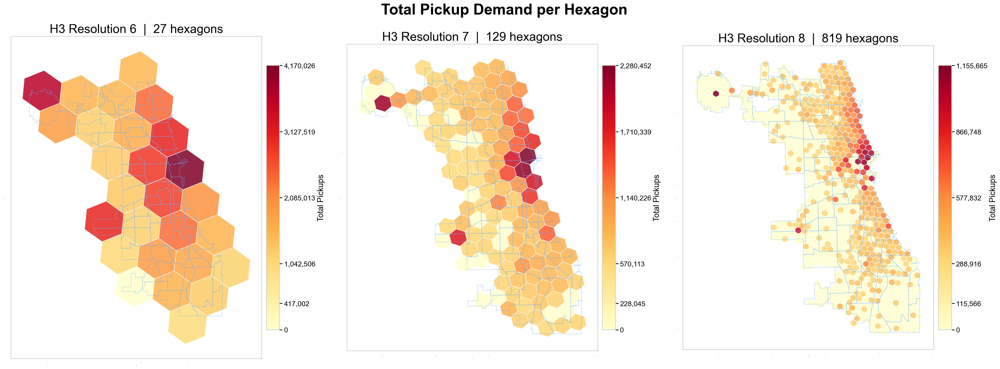

In [182]:
def aggregate_demand(df: pd.DataFrame,
                     spatial_col: str,
                     time_col: str,
                     agg_label: str) -> pd.DataFrame:
    """
    Count pickup demand per (spatial_unit, time_bucket).

    Parameters
    ----------
    spatial_col : column to use as spatial unit  (e.g. 'pickup_h3_r7')
    time_col    : column to use as time bucket   (e.g. 'hour', 'bucket_4h', 'date')
    agg_label   : human-readable label for this aggregation
    """
    demand = (
        df.groupby([spatial_col, time_col], observed=True)
          .size()
          .reset_index(name='trip_count')
          .rename(columns={spatial_col: 'spatial_unit', time_col: 'time_bucket'})
    )
    demand['spatial_col'] = spatial_col
    demand['time_col']    = time_col
    demand['agg_label']   = agg_label
    return demand

# Cast to memory-efficient dtypes before groupby to avoid MemoryError
df_demand['pickup_community_area'] = df_demand['pickup_community_area'].astype('Int16')
df_demand['hour']     = df_demand['hour'].astype('Int8')
df_demand['date']     = df_demand['date'].astype(str)
df_demand['bucket_4h'] = df_demand['bucket_4h'].astype(str)  # drop CategoricalDtype

demands = {}
for res in H3_RESOLUTIONS:
    h3_col = f'pickup_h3_r{res}'
    demands[f'h3r{res}_hourly']  = aggregate_demand(df_demand, h3_col, 'hour',       f'H3-R{res} | Hourly')
    demands[f'h3r{res}_4h']      = aggregate_demand(df_demand, h3_col, 'bucket_4h',  f'H3-R{res} | 4-Hourly')
    demands[f'h3r{res}_daily']   = aggregate_demand(df_demand, h3_col, 'date',       f'H3-R{res} | Daily')

# Census-tract baseline
demands['tract_hourly'] = aggregate_demand(df_demand, 'pickup_community_area', 'hour',      'Community Area | Hourly')
demands['tract_4h']     = aggregate_demand(df_demand, 'pickup_community_area', 'bucket_4h', 'Community Area | 4-Hourly')
demands['tract_daily']  = aggregate_demand(df_demand, 'pickup_community_area', 'date',      'Community Area | Daily')

print('Demand tables created:')
for k, v in demands.items():
    print(f'  {k:30s}  →  {len(v):,} rows')

# Set to 0 to hide axis labels/ticks (frame stays visible either way);
# set to e.g. 16 / 13 to show them again.
AXIS_LABEL_FONTSIZE = 0
TICK_LABEL_FONTSIZE = 0

def choropleth_total_demand(h3_grids: dict, demands: dict,
                             resolutions: list, title_suffix: str = '') -> None:
    """Plot total demand per hexagon as a filled choropleth for each resolution."""
    fig, axes = plt.subplots(1, len(resolutions), figsize=(10 * len(resolutions), 13),
                              facecolor=BG_COLOR)
    if len(resolutions) == 1:
        axes = [axes]

    fig.suptitle(f'Total Pickup Demand per Hexagon{title_suffix}',
                 fontsize=32, fontweight='bold', color=TEXT_COLOR, y=0.92)

    for ax, res in zip(axes, resolutions):
        ax.set_facecolor(FIG_COLOR)
        ax.grid(False)

        # Aggregate total demand per h3 cell
        dem = demands[f'h3r{res}_hourly'].groupby('spatial_unit')['trip_count'].sum().reset_index()
        dem.columns = ['h3_id', 'total_demand']

        gdf_plot = h3_grids[res].merge(dem, on='h3_id', how='left')
        gdf_plot['total_demand'] = gdf_plot['total_demand'].fillna(0)

        # Community borders
        gdf_communities.boundary.plot(ax=ax, color='#6ab0ff', linewidth=0.7, alpha=0.6)

        gdf_plot['color'] = compute_choropleth_colors(gdf_plot['total_demand'])
        gdf_plot.plot(ax=ax, color=gdf_plot['color'], alpha=0.85)
        add_colorbar(ax, gdf_plot['total_demand'].max(), label='Total Pickups',
                     shrink=0.65, pad=0.015)

        n_hex = len(h3_grids[res])
        ax.set_title(f'H3 Resolution {res}  |  {n_hex:,} hexagons',
                     fontsize=26, color=TEXT_COLOR, pad=8)

        # Axis labels/ticks stay in the layout (frame intact), just sized to 0 for now
        ax.set_xlabel('Longitude', fontsize=AXIS_LABEL_FONTSIZE)
        ax.set_ylabel('Latitude',  fontsize=AXIS_LABEL_FONTSIZE)
        ax.tick_params(labelsize=TICK_LABEL_FONTSIZE)

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'demand_choropleth.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
    plt.show()

choropleth_total_demand(h3_grids, demands, H3_RESOLUTIONS)

The maps show total pickup demand at three H3 resolutions (6, 7, and 8). Key observations:

- **Demand concentration:** Regardless of resolution, pickups are heavily concentrated in the northeastern corridor (downtown Loop / lakefront), confirming this as Chicago's primary taxi demand hub
- **South and west sides:** Both areas show consistently low demand, likely reflecting lower commercial activity and different transport mode preferences
- **Hotspot locality:** At resolution 8, only a handful of hexagons light up in deep red, while the vast majority of the city sits near zero, showing how localized the hotspot truly is
- **Sparsity at high resolution:** Resolution 8 introduces many near-zero cells across the city, which is worth keeping in mind for downstream modeling tasks

#### Temporal Demand Profiles

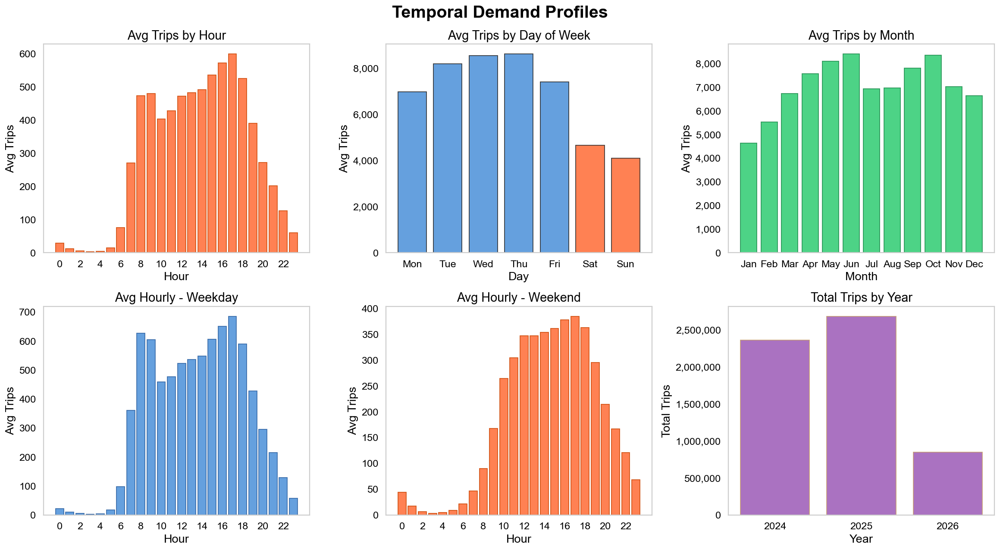

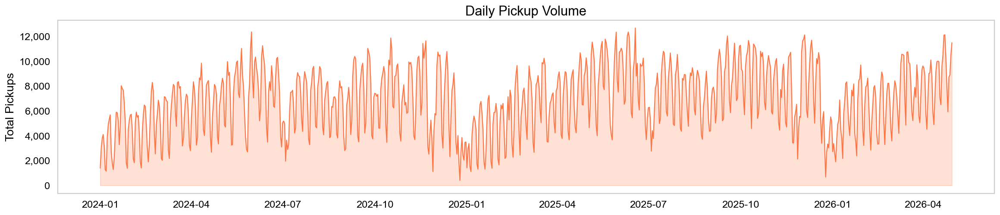

In [183]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), facecolor=BG_COLOR)
fig.suptitle('Temporal Demand Profiles', fontsize=22, fontweight='bold', color=TEXT_COLOR)
axes = axes.flatten()
for ax in axes:
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)

def bar(ax, x, y, color, edge, title, xlabel, ylabel='Avg Trips'):
    ax.bar(x, y, color=color, edgecolor=edge, alpha=0.85, width=0.8)
    ax.set_title(title, color=TEXT_COLOR, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.tick_params(labelsize=13)
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v):,}'))

def avg_demand(group_col, date_col='date'):
    """Average trips per group_col value, normalised across all dates."""
    return df_demand.groupby([group_col, date_col], observed=True).size().groupby(level=0).mean()

# Hour of day — avg trips per hour across all days
hourly_all = avg_demand('hour')
bar(axes[0], hourly_all.index, hourly_all.values, '#ff6b35', '#cc4400', 'Avg Trips by Hour', 'Hour')
axes[0].set_xticks(range(0, 24, 2))

# Day of week — avg trips per weekday across all weeks
dow_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dow = avg_demand('day_name').reindex(dow_order)
bar(axes[1], ['Mon','Tue','Wed','Thu','Fri','Sat','Sun'], dow.values,
    ['#4a90d9']*5 + ['#ff6b35']*2, '#222', 'Avg Trips by Day of Week', 'Day')

# Month — avg trips per month across all years
monthly = avg_demand('month')
month_labels = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
bar(axes[2], [month_labels[int(m)-1] for m in monthly.index], monthly.values,
    '#2ecc71', '#1a8a4a', 'Avg Trips by Month', 'Month')

# Weekday vs Weekend — avg hourly trips
for ax, (label, is_weekend, color, edge) in zip(axes[3:5], [
    ('Weekday', False, '#4a90d9', '#2a5fa0'),
    ('Weekend', True,  '#ff6b35', '#cc4400')
]):
    sub = df_demand[df_demand['is_weekend'] == is_weekend]
    h = sub.groupby(['hour', 'date'], observed=True).size().groupby(level=0).mean()
    bar(ax, h.index, h.values, color, edge, f'Avg Hourly - {label}', 'Hour')
    ax.set_xticks(range(0, 24, 2))

# Year — total trips per year
yearly = df_demand.groupby(df_demand['trip_start_timestamp'].dt.year, observed=True).size()
bar(axes[5], [str(int(y)) for y in yearly.index], yearly.values,
    '#9b59b6', '#c49a6c', 'Total Trips by Year', 'Year', ylabel='Total Trips')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'temporal_demand_profiles.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

# Daily trend
daily_citywide = df_demand.groupby('date').size().reset_index(name='trips')
daily_citywide['date'] = pd.to_datetime(daily_citywide['date'])

fig, ax = plt.subplots(figsize=(18, 4), facecolor=BG_COLOR)
ax.set_facecolor(FIG_COLOR)
ax.grid(False)
ax.plot(daily_citywide['date'], daily_citywide['trips'],
        color='#ff6b35', linewidth=1.2, alpha=0.9)
ax.fill_between(daily_citywide['date'], daily_citywide['trips'],
                alpha=0.2, color='#ff6b35')
ax.set_title('Daily Pickup Volume', fontsize=17, color=TEXT_COLOR)
ax.set_ylabel('Total Pickups', fontsize=15)
ax.tick_params(labelsize=13)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

The charts above break down taxi demand across several temporal dimensions. Key observations:

- **Hourly pattern:** Demand follows a clear bimodal shape with a morning rush around 8am and a stronger evening peak around 16-18h, dropping sharply overnight
- **Weekday vs. weekend:** The weekday profile shows two distinct peaks (commuter-driven), while weekends shift to a single broad afternoon/evening peak, reflecting leisure rather than commute trips
- **Day of week:** Midweek (Tue-Thu) sees the highest demand, while Saturday and Sunday are notably lower, around 40-50% less than the weekday average
- **Monthly pattern:** Demand is lowest in winter (Jan-Feb), picks up and increases around spring, and peaks around May-June and again in September-October, suggesting sensitivity to weather and seasonal activity
- **Total trips by year:** 2024 and 2025 show comparable full-year volumes (~2.7M and ~3M), while 2026 is low by design since the dataset only covers the first months of the year
- **Overall trend:** Demand appears relatively stable across the two years with no strong upward or downward trend, suggesting the Chicago taxi market is mature and not rapidly growing
- **Spikes:** Several high-volume days with more than 14,000 trips stand out, likely corresponding to major events in the city (concerts, sports finals, conventions)

#### Idle Time Computation Logic

1. Next Start (Shift): `next_start[i] = Start[i+1]` (per driver)
2. Delta (Minutes): `idle_min[i] = (Start[i+1] - End[i]) / 60`
3. Filter Set: `I_idle = { idle_min ∈ ℝ | 0 < idle_min < 90 }`

In [184]:
# Idle Time computation for Graphic & Profitability Analysis

# ── Idle Time Computation ─────────────────────────────────────────────────
# Idle Time is assigned to the trip that just ended, as it represents the time until the next trip starts.
df_demand['idle_min'] = (
    df_demand.sort_values(['taxi_id', 'trip_start_timestamp'])
             .groupby('taxi_id')['trip_start_timestamp']
             .shift(-1)
             .sub(df_demand['trip_end_timestamp'])
             .dt.total_seconds() / 60
)

#df_demand['idle_min'] = df_demand['idle_min'].where(df_demand['idle_min'].between(0, 90), 0)


df_demand['idle_min'] = df_demand['idle_min'][(df_demand['idle_min'] > 0) & (df_demand['idle_min'] < 90)]
print(f"idle_min NaN in df_demand: {df_demand['idle_min'].isna().sum():,}")
df_demand['idle_min']    = df_demand['idle_min'].fillna(0)  # missing values are interpreted as 0 idle time
print(f"idle_min NaN in df_demand: {df_demand['idle_min'].isna().sum():,}")

idle_min NaN in df_demand: 3,415,508
idle_min NaN in df_demand: 0


#### Trip Metric Distributions

With idle time computed, we can look at the distribution of the core trip-level metrics (duration, distance, fare, tips, total cost, and idle time) to get a sense of what a "typical" trip looks like before moving on to the spatial breakdowns.

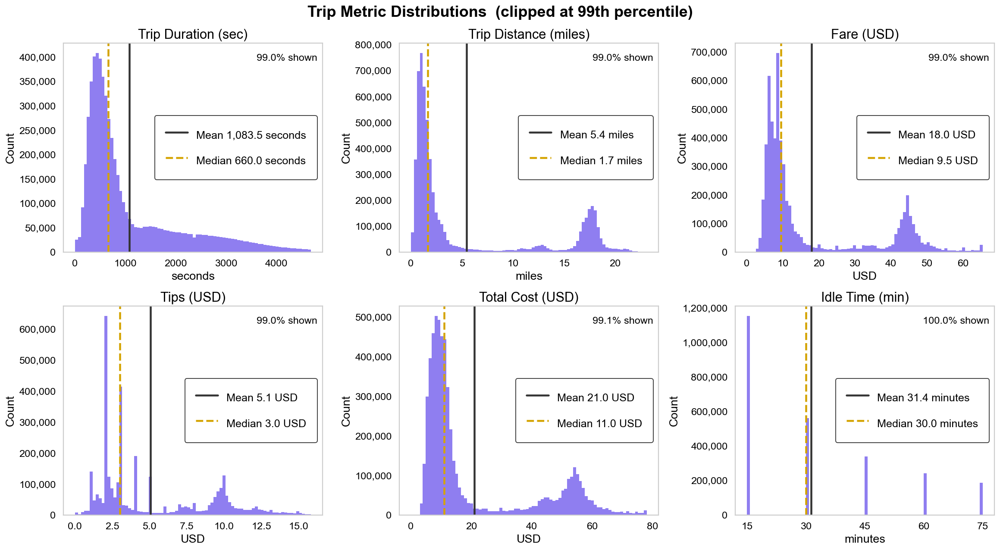

In [185]:
metrics = [
    ('trip_seconds', df_demand, 'Trip Duration (sec)',   'seconds'),
    ('trip_miles',   df_demand, 'Trip Distance (miles)', 'miles'),
    ('fare',         df_demand, 'Fare (USD)',             'USD'),
    ('tips',         df_demand, 'Tips (USD)',             'USD'),
    ('trip_total',   df_demand, 'Total Cost (USD)',       'USD'),
    ('idle_min',     df_demand, 'Idle Time (min)',        'minutes'),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10), facecolor=BG_COLOR)
fig.suptitle('Trip Metric Distributions  (clipped at 99th percentile)',
             fontsize=20, fontweight='bold', color=TEXT_COLOR)
axes = axes.flatten()

for ax, (col, source, label, unit) in zip(axes, metrics):
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)
    data      = source[col].dropna() if col is not None else source
    data      = data[data > 0]
    p99       = data.quantile(0.99)
    clipped   = data[data <= p99]
    pct_shown = 100 * len(clipped) / len(data)

    ax.hist(clipped, bins=80, color='#7b68ee', edgecolor='none', alpha=0.85)

    mean_val   = clipped.mean()
    median_val = clipped.median()
    ax.axvline(mean_val, color='#333333', linewidth=2.5,
               label=f'Mean {mean_val:,.1f} {unit}')
    ax.axvline(median_val, color='#d4a300', linewidth=2.5, linestyle='--',
               label=f'Median {median_val:,.1f} {unit}')

    ax.set_title(label, color=TEXT_COLOR, fontsize=17)
    ax.set_xlabel(unit, fontsize=15)
    ax.set_ylabel('Count', fontsize=15)
    ax.tick_params(labelsize=13)
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
    if unit == 'minutes':
        ax.xaxis.set_major_locator(ticker.MultipleLocator(15))
    ax.legend(fontsize=14, facecolor=FIG_COLOR, labelcolor=TEXT_COLOR,
              edgecolor=BORDER_COLOR, handlelength=2, handleheight=2,
              borderpad=1, labelspacing=0.8)
    ax.text(0.98, 0.95, f'{pct_shown:.1f}% shown',
            transform=ax.transAxes, fontsize=13, color=TEXT_COLOR,
            ha='right', va='top')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'trip_metric_distributions.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

The distributions cover the core trip metrics, all clipped at the 99th percentile to reduce the effect of outliers. Key observations:

- **Right-skewed distributions:** Every metric shows a strong right skew, with the mean pulled well above the median in all cases. This indicates a relatively small number of long, expensive trips inflating the averages significantly.
- **Trip duration:** The median trip takes about 10 minutes (626 sec), but the mean is nearly 17 minutes (1,028 sec), suggesting some very long rides are common enough to shift the average.
- **Trip distance:** Most trips are also short in distance (median 1.6 miles), yet the mean is 5.4 miles. The secondary bump around 17-18 miles likely corresponds to airport runs (O'Hare is ~17 miles from downtown).
- **Fare and total cost:** The same secondary bump appears in both fare and total cost around the $40-60 range, reinforcing the airport trip hypothesis. Median total cost is $11.1 USD.
- **Tips:** Heavily concentrated near zero and around $2-$3, suggesting many passengers tip a fixed small amount. Surprisingly, the number of trips without any tips is vanishingly small, which could be explained by default tip suggestions built into the payment terminal nudging passengers towards tipping. The mean ($5.2) is again pulled up by occasional large tips.
- **Idle time:** Median idle time between trips is 30 minutes, but the mean sits at 58.8 minutes, pointing to periods of low demand where drivers wait significantly longer for the next fare. Apart from that, the highest number of trips have a relatively short idle time of just 15 minutes.

#### Helper for Graphics of Spatio Temporal Analysis

In [186]:
def make_bucket_figure(n_buckets, ncols, title, plot_res=None):
    """GridSpec figure with a dedicated right colorbar column."""
    nrows = (n_buckets + ncols - 1) // ncols
    gs = plt.GridSpec(nrows, ncols + 1, figure=plt.figure(
        figsize=(7 * ncols + 1, 9 * nrows), facecolor=BG_COLOR),
        width_ratios=[1] * ncols + [0.05])
    fig = plt.gcf()
    axes_flat = [fig.add_subplot(gs[r, c]) for r in range(nrows) for c in range(ncols)]
    cbar_ax   = fig.add_subplot(gs[:, ncols])
    fig.suptitle(title, fontsize=26, fontweight='bold', color=TEXT_COLOR, y=0.99)
    return fig, axes_flat, cbar_ax


def plot_hex_bucket(ax, gdf_hex, sub_df, value_col, h3_id_col, vmax, title,
                    cmap_name=PALETTE, fill_na=0.0, zero_color=None):
    """Merge a demand sub-table onto the H3 grid and plot one bucket."""
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)
    gdf_plot = gdf_hex.merge(
        sub_df[[h3_id_col, value_col]].rename(columns={h3_id_col: 'h3_id'}),
        on='h3_id', how='left')
    gdf_plot[value_col] = gdf_plot[value_col].fillna(fill_na)
    gdf_plot['color']   = compute_choropleth_colors(
        gdf_plot[value_col], vmax, cmap_name=cmap_name, zero_color=zero_color)
    gdf_communities.boundary.plot(ax=ax, color=BORDER_COLOR, linewidth=0.7, alpha=0.9)
    gdf_plot.plot(ax=ax, color=gdf_plot['color'], alpha=0.9)
    ax.set_title(title, fontsize=18, color=TEXT_COLOR, pad=8)
    ax.tick_params(labelsize=0)

#### Spatial-Temporal Analysis

Here pickups are illustrated.

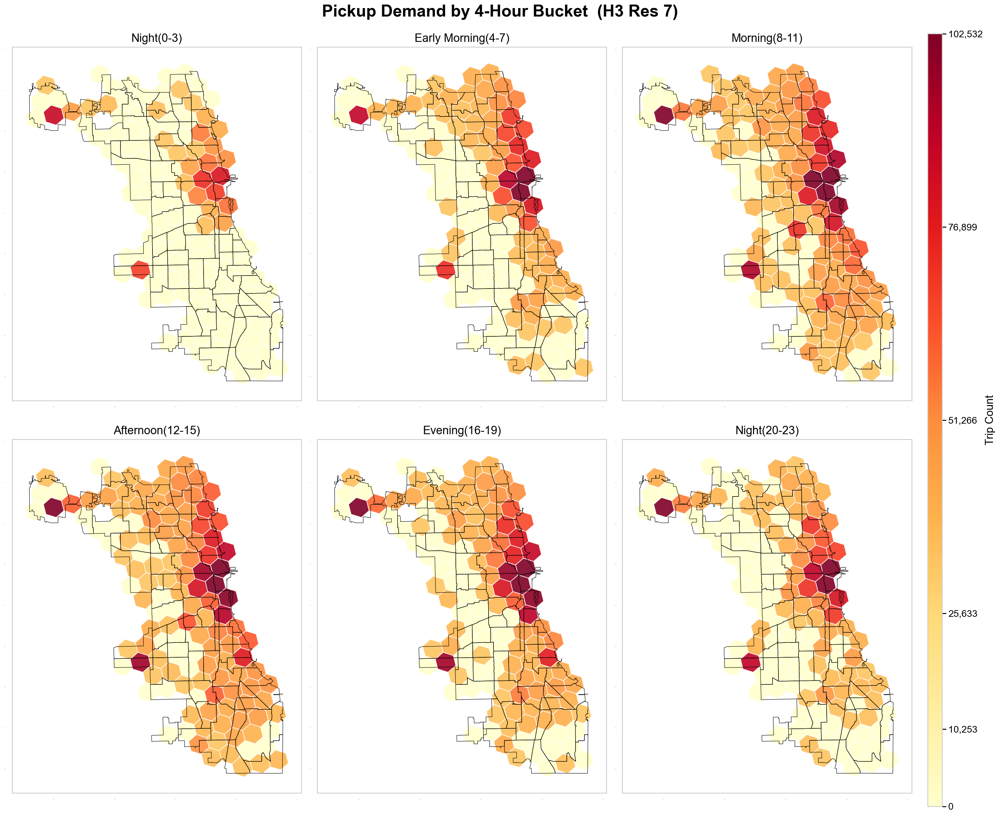

In [187]:
PLOT_RES = 7
dem_4h   = demands[f'h3r{PLOT_RES}_4h']

bucket_order = {lab: i for i, lab in enumerate(labels_4h)}
buckets = sorted(
    dem_4h['time_bucket'].unique().tolist(),
    key=lambda b: bucket_order.get(b, 10**9),
)
vmax = dem_4h['trip_count'].quantile(0.97)

fig, axes_flat, cbar_ax = make_bucket_figure(
    len(buckets), ncols=3,
    title=f'Pickup Demand by 4-Hour Bucket  (H3 Res {PLOT_RES})',
    plot_res=PLOT_RES)

for ax, bucket in zip(axes_flat, buckets):
    sub = dem_4h[dem_4h['time_bucket'] == bucket]
    plot_hex_bucket(ax, h3_grids[PLOT_RES], sub,
                    value_col='trip_count', h3_id_col='spatial_unit',
                    vmax=vmax, title=bucket)

for ax in axes_flat[len(buckets):]:
    ax.set_visible(False)

add_colorbar(None, vmax, label='Trip Count', cax=cbar_ax)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'demand_4h_buckets.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

These maps show pickup demand broken into 4-hour time buckets at H3 resolution 7. Key observations:

- **Persistent hotspot:** The northeastern lakefront / downtown corridor remains the dominant demand hub across all time buckets, confirming it as a structurally important area regardless of time of day
- **Night (0-3):** Demand is low overall, but interestingly the downtown core still shows relative activity, likely driven by nightlife and late-night rides home
- **Early Morning (4-7):** A notable hotspot appears further south around the Midway airport area, which makes sense given early morning flight departures
- **Morning (8-11) and Afternoon (12-15):** Demand spreads more evenly across eastern Chicago, reflecting a broader mix of commuter, business, and leisure trips
- **Afternoon / Evening (12-19):** The peak demand window, consistent with the hourly charts seen earlier. The downtown core intensifies sharply while the rest of the city remains comparatively quiet
- **Night (20-23):** Demand begins tapering off but the lakefront strip retains a clear hotspot, again likely driven by entertainment and restaurant activity in the area

#### Spatio-Temporal Analysis: Net Flow

Here not the drop-off as a trivial opponent of the pickup is presented, but a net flow (pickup − dropoff) that shows the potential for taxi fleet operators. This enables sophisticated steering, as the dropoff locations do not have to be manually set into relation to the pickup locations, but directly shows where additional not-served (through dropoff) demand is created.

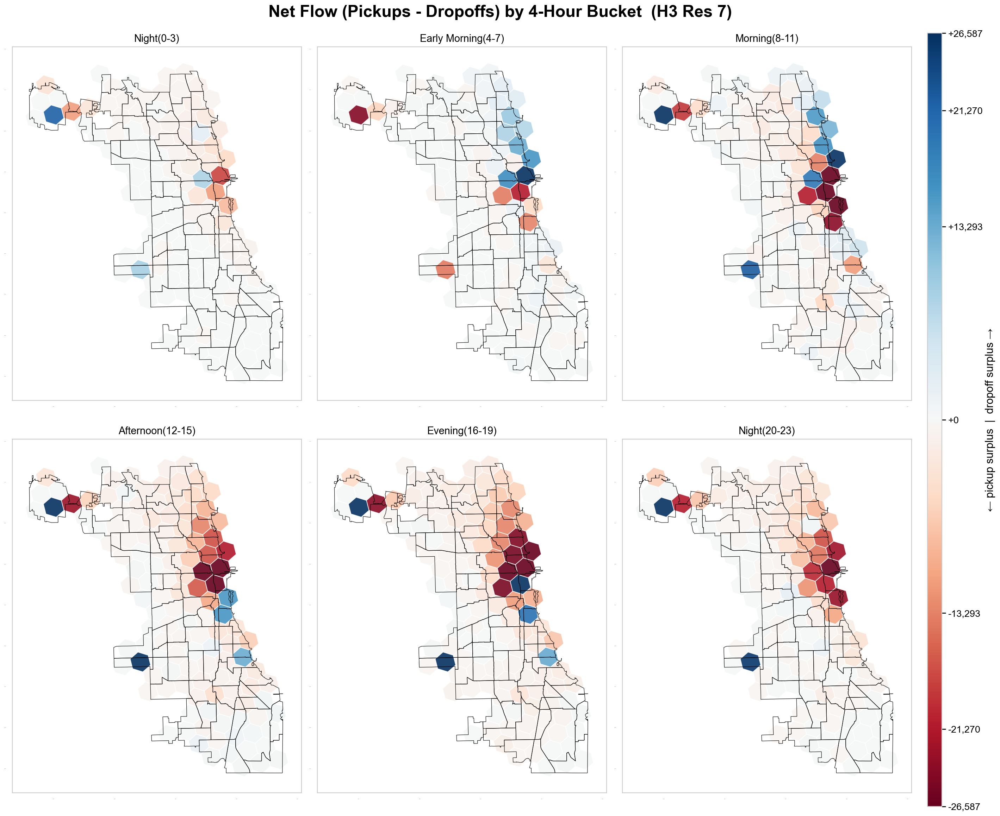

In [188]:
# ── Net Flow (Pickups − Dropoffs) by 4-Hour Bucket  (H3 Res 7) ───────────
# Positive = more pickups than dropoffs (demand > supply → good for driver)
# Negative = more dropoffs than pickups (supply > demand → vehicles accumulate)
# Zero     = balanced

netflow_4h = (
    demands[f'h3r{PLOT_RES}_4h']
        .rename(columns={'spatial_unit': 'h3_id', 'trip_count': 'pickups'})
        .merge(
            aggregate_demand(df_demand, f'dropoff_h3_r{PLOT_RES}', 'bucket_4h', '')
                .rename(columns={'spatial_unit': 'h3_id', 'trip_count': 'dropoffs'}),
            on=['h3_id', 'time_bucket'], how='outer')
        .fillna(0)
)
netflow_4h['net_flow'] = netflow_4h['pickups'] - netflow_4h['dropoffs']
vabs = netflow_4h['net_flow'].abs().quantile(0.97)

bucket_order = {lab: i for i, lab in enumerate(labels_4h)}
buckets = sorted(
    netflow_4h['time_bucket'].unique().tolist(),
    key=lambda b: bucket_order.get(b, 10**9),
)

fig, axes_flat, cbar_ax = make_bucket_figure(
    len(buckets), ncols=3,
    title=f'Net Flow (Pickups - Dropoffs) by 4-Hour Bucket  (H3 Res {PLOT_RES})')

cmap_nf    = plt.get_cmap('RdBu')
neutral_nf = mcolors.to_hex(cmap_nf(0.5))

for ax, bucket in zip(axes_flat, buckets):
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)
    sub      = netflow_4h[netflow_4h['time_bucket'] == bucket].copy()
    gdf_plot = h3_grids[PLOT_RES].merge(
        sub[['h3_id', 'net_flow']], on='h3_id', how='left')
    gdf_plot['net_flow'] = gdf_plot['net_flow'].fillna(0)

    deviation = gdf_plot['net_flow'].clip(-vabs, vabs)
    norm      = 0.5 + 0.5 * np.sign(deviation) * (deviation.abs() / vabs) ** 0.4
    gdf_plot['color'] = [neutral_nf if v == 0
                         else mcolors.to_hex(cmap_nf(n))
                         for v, n in zip(gdf_plot['net_flow'], norm)]

    gdf_communities.boundary.plot(ax=ax, color=BORDER_COLOR, linewidth=0.7, alpha=0.9)
    gdf_plot.plot(ax=ax, color=gdf_plot['color'], alpha=0.9)
    ax.set_title(bucket, fontsize=16, color=TEXT_COLOR, pad=8)
    ax.tick_params(labelsize=0)

for ax in axes_flat[len(buckets):]:
    ax.set_visible(False)

sm = plt.cm.ScalarMappable(cmap=cmap_nf)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label('← pickup surplus  |  dropoff surplus →', color=TEXT_COLOR, fontsize=17)
ticks = [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
cbar.set_ticks(ticks)
cbar.set_ticklabels([f'{int((t - 0.5) * 2 * vabs):+,}' for t in ticks])
plt.setp(cbar.ax.yaxis.get_ticklabels(), color=TEXT_COLOR, fontsize=15)
cbar.ax.tick_params(length=6, width=1.5)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'netflow_4h_buckets.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

In these maps, red indicates a pickup surplus (more people leaving than arriving by taxi), blue a dropoff surplus (more people being dropped off than picked up). Key observations:

- **Morning (8-11):** The downtown lakefront shows a strong dropoff surplus (blue), as commuters are delivered into the city center. Residential areas to the north show a pickup surplus (red), confirming the classic morning commute pattern flowing inward
- **Afternoon / Evening (12-19):** The pattern largely reverses. The downtown core flips to a pickup surplus as workers leave, while surrounding neighborhoods receive more dropoffs. This is a typical commuter flow reversal
- **Early Morning (4-7):** A clear pickup surplus appears around the Midway airport area in the south, consistent with early departures, while the northern lakefront shows dropoff activity likely linked to O'Hare-bound passengers being dropped off
- **Evening (16-19) and Night (20-23):** The net flow first indicates a dropoff surplus in downtown hexagons, possibly indicating people arriving in the city center for dinner and nightlife, while the pattern reverses later into the night, which could be the same people being picked up and taken back home after a night out
- **Fleet implications:** These flow patterns are directly relevant for fleet repositioning. A smart operator would anticipate the morning inflow to downtown and pre-position vehicles in residential areas, then shift capacity back outward ahead of the evening peak

#### OD Top Community Areas & Hour×DoW 

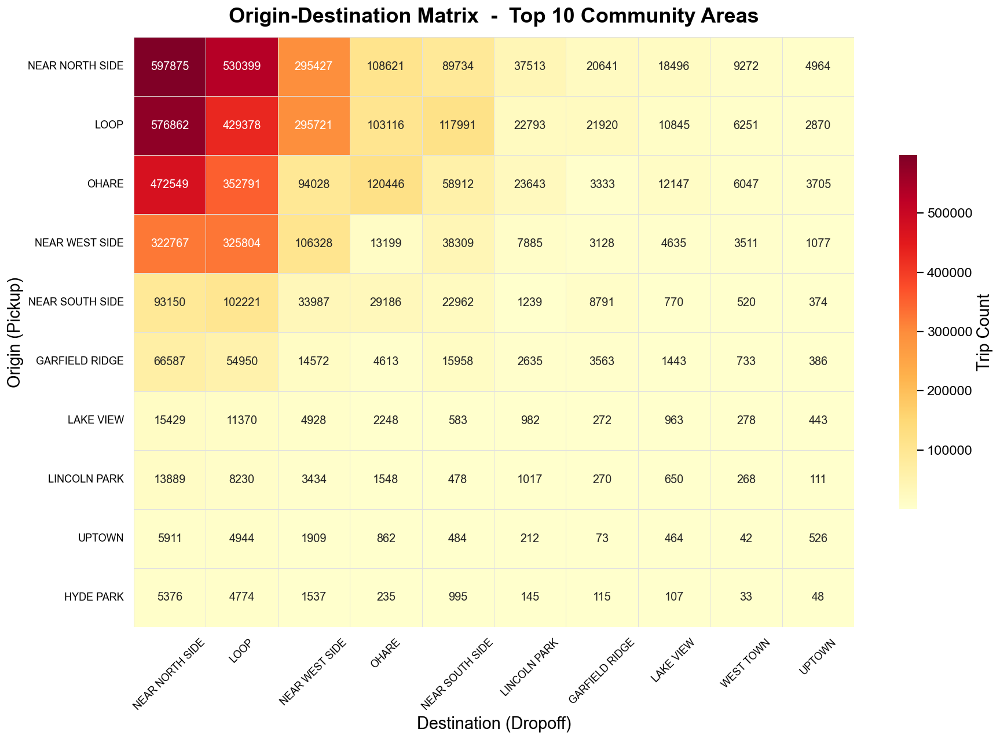

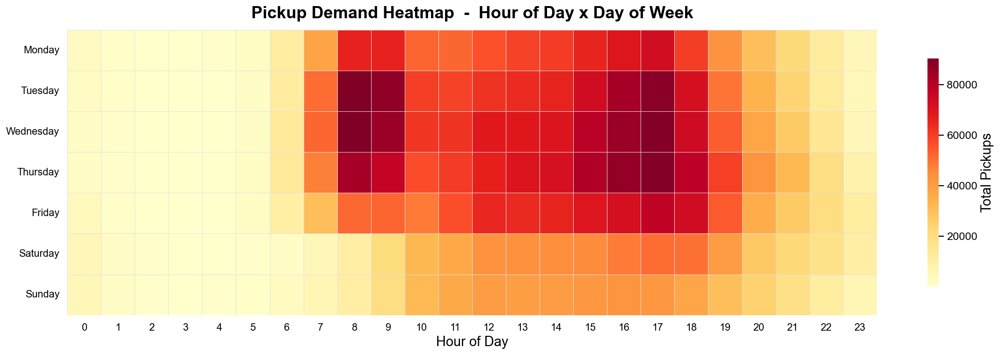

In [189]:
# ── OD Matrix: Top 10 Pickup × Top 10 Dropoff Community Areas ────────────
od = (df_demand
      .groupby(['pickup_community_name', 'dropoff_community_name'])
      .size()
      .reset_index(name='trips'))

od_pivot = od.pivot(index='pickup_community_name',
                    columns='dropoff_community_name',
                    values='trips').fillna(0)

top10_origins = od_pivot.sum(axis=1).nlargest(10).index
top10_dests   = od_pivot.sum(axis=0).nlargest(10).index
od_pivot = od_pivot.loc[top10_origins, top10_dests]

fig, ax = plt.subplots(figsize=(14, 10), facecolor=BG_COLOR)
ax.set_facecolor(FIG_COLOR)

sns.heatmap(
    od_pivot, ax=ax, cmap='YlOrRd', linewidths=0.3, linecolor='#e0e0e0',
    annot=True, fmt='.0f', annot_kws={'fontsize': 11},
    cbar_kws={'label': 'Trip Count', 'shrink': 0.6}
)
cbar = ax.collections[0].colorbar
cbar.set_label('Trip Count', fontsize=16, color=TEXT_COLOR)
cbar.ax.tick_params(labelsize=13)

ax.set_title('Origin-Destination Matrix  -  Top 10 Community Areas',
             fontsize=20, fontweight='bold', color=TEXT_COLOR, pad=14)
ax.set_xlabel('Destination (Dropoff)', fontsize=16)
ax.set_ylabel('Origin (Pickup)', fontsize=16)
ax.tick_params(axis='x', labelsize=10, rotation=45)
ax.tick_params(axis='y', labelsize=10, rotation=0)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'od_matrix_community.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

pivot = (
    df_demand.groupby(['day_name', 'hour'])
          .size()
          .reset_index(name='trips')
)
dow_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot.pivot(index='day_name', columns='hour', values='trips')
pivot_table = pivot_table.reindex(dow_order)

fig, ax = plt.subplots(figsize=(18, 6), facecolor=BG_COLOR)
ax.set_facecolor(FIG_COLOR)

sns.heatmap(
    pivot_table, ax=ax, cmap='YlOrRd', linewidths=0.3, linecolor='#e0e0e0',
    annot=False, fmt=',',
    cbar_kws={'label': 'Total Pickups', 'shrink': 0.8}
)
cbar = ax.collections[0].colorbar
cbar.set_label('Total Pickups', fontsize=16, color=TEXT_COLOR)
cbar.ax.tick_params(labelsize=13)

ax.set_title('Pickup Demand Heatmap  -  Hour of Day x Day of Week',
             fontsize=20, fontweight='bold', color=TEXT_COLOR, pad=14)
ax.set_xlabel('Hour of Day', fontsize=16)
ax.set_ylabel('', fontsize=16)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12, rotation=0)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'heatmap_hour_dow.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

**Heatmap: Pickup Demand by Hour x Day of Week**

The heatmap confirms and sharpens the temporal patterns seen earlier. Key observations:

- **Core demand window:** The bulk of trips occur between 7am and 19h on weekdays, forming a dense red block from Tuesday to Thursday that represents the highest demand in the dataset
- **Weekend shift:** Saturday and Sunday show a notably different pattern with demand starting later (no early morning spike) and trailing off more gradually, consistent with leisure rather than commute-driven travel
- **Dead hours:** The 0-6h window is uniformly quiet across all days, making it a natural candidate for driver rest or vehicle charging windows

---

**Origin-Destination Matrix: Top 10 Community Areas**

The OD matrix reveals where trips start and end among the city's busiest community areas. Key observations:

- **Near North Side and Loop dominate:** These two areas account for the highest trip volumes both as origins and destinations by a wide margin, reinforcing their role as Chicago's primary mobility hub
- **O'Hare as a major origin:** Despite being geographically isolated, O'Hare generates nearly 500k trips to Near North Side and Loop alone, confirming that airport-to-downtown is one of the most important corridors in the network
- **Intra-zone trips:** The diagonal for Near North Side and Loop shows significant within-zone activity, suggesting many short trips that stay within the same neighborhood
- **Asymmetry:** Flow from the top three zones (Near North Side, Loop, O'Hare) to the rest of the city is much stronger than the reverse, indicating these are "net exporters" of taxi demand

#### Potential: Profitability per Productive Hour - incl. Fare (total), Duration, Idle Time, Miles

With weighted avg. of pickup & dropoff (as pickup profitability of follow-up pickup). All simple trips are averaged with their profitability.

In [190]:
print(df_demand.columns.tolist())

['trip_id', 'taxi_id', 'trip_start_timestamp', 'trip_end_timestamp', 'pickup_community_area', 'dropoff_community_area', 'pickup_centroid_latitude', 'pickup_centroid_longitude', 'dropoff_centroid_latitude', 'dropoff_centroid_longitude', 'fare', 'tips', 'trip_seconds', 'trip_miles', 'date', 'hour', 'day_of_week', 'week', 'month', 'is_weekend', 'day_name', 'bucket_4h', 'trip_total', 'pickup_h3_r6', 'dropoff_h3_r6', 'pickup_h3_r7', 'dropoff_h3_r7', 'pickup_h3_r8', 'dropoff_h3_r8', 'pickup_community_name', 'dropoff_community_name', 'idle_min']


#### Profitability Methodology

$$\text{profit\_rate}_i = \frac{\text{fare}_i - C_{\text{time}} \cdot (t^{\text{trip}}_i + t^{\text{idle}}_i) - C_{\text{dist}} \cdot d_i}{t^{\text{trip}}_i / 3600}$$

`profit_rate` ist der geschätzte Nettoverdienst pro produktiver Stunde ($/hr): Fare abzüglich Zeit- und Distanzkosten, normiert auf die Trip-Dauer in Stunden.

| Parameter | Value | Justification |
|---|---|---|
| $\text{fare}_i$ | aus Daten | tatsächlich gezahlte Fahrtkosten der Trip $i$ |
| $t^{\text{trip}}_i$ | aus Daten | Trip-Dauer in Sekunden |
| $d_i$ | aus Daten | Trip-Distanz in Meilen |
| $C_{\text{time}}$ | 0.0045 USD/sec | Chicago minimum wage $16.20/hr (July 2024) [https://www.chicago.gov/city/en/depts/bacp/supp_info/minimumwageinformation.html](https://www.chicago.gov/city/en/depts/bacp/supp_info/minimumwageinformation.html) |
| $C_{\text{dist}}$ | 0.04 USD/mile | ComEd $0.16/kWh ÷ 4 miles/kWh (EV) |
| $t^{\text{idle}}$ | shift-based, capped 240 min | gap between consecutive trips per taxi |
| outlier filter | p1-p99 on profit_rate | removes data artefacts and flat-rate airport fares |

In [191]:
# ── Profitability columns for df_demand ───────────────────────────────────
COST_WAGE = 0.0045  # USD/sec (~16.20 USD/hr, Chicago min wage)
COST_DIST = 0.04    # USD/mile (ComEd EV cost)

# 1. Basic filter before calculation — removes data errors
df_demand = df_demand[
    df_demand['trip_seconds'].gt(60) &
    df_demand['trip_miles'].gt(0.1) &
    df_demand['fare'].gt(0)
]
 
# 2. Profitability calculation on valid trips
df_demand['cost'] = (COST_WAGE * (df_demand['trip_seconds'] + df_demand['idle_min'] * 60) + COST_DIST * df_demand['trip_miles'])
df_demand['profit'] = df_demand['fare'] - df_demand['cost']
df_demand['profit_rate'] = df_demand['profit'] / (df_demand['trip_seconds'] / (60*60))

print(f"df_demand after basic filter: {len(df_demand):,} trips")

# 3. Staticial Outlier-filter on profit_rate
df_demand = df_demand[
    df_demand['profit_rate'].between(
        df_demand['profit_rate'].quantile(0.01),
        df_demand['profit_rate'].quantile(0.99))
]

print(f"df_demand after outlier filter: {len(df_demand):,} trips")

df_demand after basic filter: 5,861,425 trips
df_demand after outlier filter: 5,744,196 trips


In [192]:
print(df_demand.columns.tolist())

['trip_id', 'taxi_id', 'trip_start_timestamp', 'trip_end_timestamp', 'pickup_community_area', 'dropoff_community_area', 'pickup_centroid_latitude', 'pickup_centroid_longitude', 'dropoff_centroid_latitude', 'dropoff_centroid_longitude', 'fare', 'tips', 'trip_seconds', 'trip_miles', 'date', 'hour', 'day_of_week', 'week', 'month', 'is_weekend', 'day_name', 'bucket_4h', 'trip_total', 'pickup_h3_r6', 'dropoff_h3_r6', 'pickup_h3_r7', 'dropoff_h3_r7', 'pickup_h3_r8', 'dropoff_h3_r8', 'pickup_community_name', 'dropoff_community_name', 'idle_min', 'cost', 'profit', 'profit_rate']


#### Profitability Mapping to 4h Buckets

`profit_hex`: one row per hexagon × 4h bucket.

`mean_profit_rate` = average profit_rate ($/hr) over all trips starting in that hexagon during that bucket.

In [193]:
from scipy.stats import rankdata

PLOT_RES  = 7
H3        = f'pickup_h3_r{PLOT_RES}'
# Compute average profit_rate of a 4-hour bucket for the profitability map, per hexagon.
profit_hex = (
    df_demand
    .groupby([H3, 'bucket_4h'])
    .agg(mean_profit_rate=('profit_rate', 'mean'))
    .reset_index()
    .rename(columns={H3: 'h3_id'})
)

# Rank-normalise mean_profit_rate within each 4-hour bucket to [0,1] for better colour differentiation in the plot.
def rank_norm(s):
    if len(s) < 2:
        return pd.Series(0.5, index=s.index)
    r = rankdata(s.values, method='average')
    return pd.Series((r - 1) / (len(r) - 1), index=s.index)

profit_hex['rank'] = profit_hex.groupby('bucket_4h')['mean_profit_rate'].transform(rank_norm)
print(f"profit_hex: {len(profit_hex):,} rows | {profit_hex['h3_id'].nunique()} hexagons")

profit_hex: 429 rows | 109 hexagons


#### Profitability Summary Table

Each cell shows the median `profit_rate` ($/hr) across all hexagons in that bucket, at the given quantile boundary. Two median levels:

1. Trip → Hexagon: median of all trip-level profit rates within each hexagon × bucket
2. Hexagon → Table: quantile boundaries over all hexagon medians per bucket

Median is used over mean at both levels to reduce distortion from outlier trips and outlier hexagons.

In [194]:
from IPython.display import display

quantiles = [0, 0.25, 0.5, 0.75, 1.0]
labels    = ['p0', 'p25', 'p50', 'p75', 'p100']

summary = (
    profit_hex.groupby('bucket_4h')['mean_profit_rate']
              .quantile(quantiles)
              .unstack(level=-1)
              .round(2)
)
summary.columns = labels
#summary.index.name = 'bucket'
summary.columns = [f'{l} ($/hr)' for l in labels]
display(summary)
print("Median profit rate ($/hr) per hexagon × 4h bucket — "
      "each value represents the median over all trip-level profit rates "
      "within that hexagon and time window.")

,p0 ($/hr),p25 ($/hr),p50 ($/hr),p75 ($/hr),p100 ($/hr)
bucket_4h,,,,,
Afternoon(12-15),-1.10,31.49,40.27,51.54,95.74
Early Morning(4-7),8.00,29.71,39.30,46.48,104.05
Evening(16-19),-4.72,26.24,40.34,57.14,110.70
Morning(8-11),-0.66,32.55,42.37,53.76,124.62
Night(0-3),34.89,44.90,50.59,61.97,88.94
Night(20-23),23.79,39.10,49.93,61.05,118.44


Median profit rate ($/hr) per hexagon × 4h bucket — each value represents the median over all trip-level profit rates within that hexagon and time window.


C:\Users\Louis Schreier\AppData\Local\Temp\ipykernel_21688\752661326.py:2: UserWarning: Overwriting the cmap 'profit_qr' that was already in the registry.
  matplotlib.colormaps.register(profit_cmap, name='profit_qr', force=True)


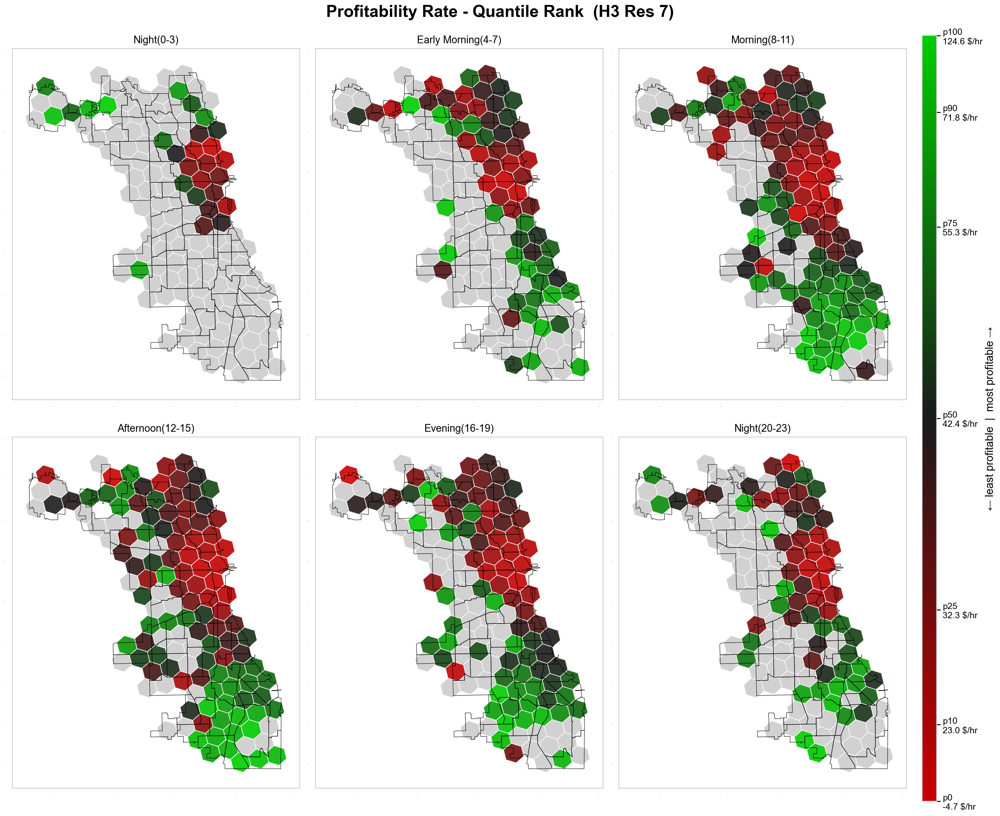

In [195]:
profit_cmap = LinearSegmentedColormap.from_list('profit_qr', ['#cc0000', '#1a1a1a', '#00cc00'])
matplotlib.colormaps.register(profit_cmap, name='profit_qr', force=True)

buckets = sorted(profit_hex['bucket_4h'].unique(), key=lambda b: bucket_order.get(b, 999))

def plot_hex_bucket_linear(ax, gdf_hex, sub_df, value_col, h3_id_col, vmax, title, cmap_name, zero_color):
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)
    gdf_plot = gdf_hex.merge(
        sub_df[[h3_id_col, value_col]].rename(columns={h3_id_col: 'h3_id'}),
        on='h3_id', how='left')
    gdf_plot[value_col] = gdf_plot[value_col].fillna(-1)
    cmap = plt.get_cmap(cmap_name)
    gdf_plot['color'] = [
        GRAY_MISSING if v < 0 else mcolors.to_hex(cmap(v / vmax))
        for v in gdf_plot[value_col]
    ]
    gdf_communities.boundary.plot(ax=ax, color=BORDER_COLOR, linewidth=0.7, alpha=0.9)
    gdf_plot.plot(ax=ax, color=gdf_plot['color'], alpha=0.9)
    ax.set_title(title, fontsize=16, color=TEXT_COLOR, pad=8)
    ax.tick_params(labelsize=0)

fig, axes_flat, cbar_ax = make_bucket_figure(
    len(buckets), ncols=3,
    title=f'Profitability Rate - Quantile Rank  (H3 Res {PLOT_RES})')

for ax, bucket in zip(axes_flat, buckets):
    sub = profit_hex[profit_hex['bucket_4h'] == bucket]
    plot_hex_bucket_linear(ax, h3_grids[PLOT_RES], sub,
                           value_col='rank', h3_id_col='h3_id',
                           vmax=1.0, title=bucket, cmap_name='profit_qr',
                           zero_color=mcolors.to_hex(profit_cmap(0.0)))
for ax in axes_flat[len(buckets):]:
    ax.set_visible(False)

sm = plt.cm.ScalarMappable(cmap=profit_cmap, norm=plt.Normalize(0, 1))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label('← least profitable  |  most profitable →', color=TEXT_COLOR, fontsize=17)

quantile_vals = profit_hex['mean_profit_rate'].quantile([0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0])
ticks         = [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
tick_labels   = [f'p{int(q*100)}\n{quantile_vals[q]:.1f} $/hr' for q in ticks]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)
plt.setp(cbar.ax.yaxis.get_ticklabels(), color=TEXT_COLOR, fontsize=14)
cbar.ax.tick_params(length=6, width=1.5)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'profitability_rank_4h.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()

The pattern here is close to a mirror image of the demand choropleths from earlier. From morning through night, the downtown/lakefront corridor, by far the busiest area for pickups, is consistently among the least profitable per hour (dark red), while hexagons on the South Side and towards the city's edges rank most profitable (green). Congestion is the likely explanation: downtown trips are short and frequent but slow, so a driver spends more time earning the same fare. The Night (0-3) and Early Morning (4-7) buckets simply have far fewer colored cells, since fewer hexagons see any trips at all during those hours.

#### Fare Efficiency per Hexagon × 4h Bucket

- `fare_per_mile` ($/mile): revenue per distance — high in short inner-city trips
- `fare_per_min` ($/min): revenue per time — high in fast, uncongested trips

Median over trips within each hexagon × bucket; rank normalised to [0,1] for colour mapping.

In [196]:
kpi_hex = (
    df_demand
    .assign(
        fare_per_mile = lambda x: x['fare'] / x['trip_miles'],
        fare_per_min  = lambda x: x['fare'] / (x['trip_seconds'] / 60)
    )
    .groupby([H3, 'bucket_4h'])
    .agg(fare_per_mile=('fare_per_mile', 'median'),
         fare_per_min =('fare_per_min',  'median'))
    .reset_index()
    .rename(columns={H3: 'h3_id'})
)

kpi_hex['rank_mile'] = kpi_hex.groupby('bucket_4h')['fare_per_mile'].transform(rank_norm)
kpi_hex['rank_min']  = kpi_hex.groupby('bucket_4h')['fare_per_min'].transform(rank_norm)

# Quantile summary
for col, unit in [('fare_per_mile', '$/mile'), ('fare_per_min', '$/min')]:
    s = (kpi_hex.groupby('bucket_4h')[col]
                .quantile([0, 0.25, 0.5, 0.75, 1.0])
                .unstack(level=-1)
                .round(2))
    s.columns = [f'p{int(q*100)} ({unit})' for q in [0, 0.25, 0.5, 0.75, 1.0]]
    s.index.name = 'bucket'
    display(s)

,p0 ($/mile),p25 ($/mile),p50 ($/mile),p75 ($/mile),p100 ($/mile)
bucket,,,,,
Afternoon(12-15),2.51,2.72,2.89,3.23,8.17
Early Morning(4-7),2.42,2.72,3.03,3.58,6.25
Evening(16-19),2.52,2.75,3.01,3.79,8.50
Morning(8-11),2.46,2.70,2.86,3.29,8.17
Night(0-3),2.49,2.95,3.54,4.65,6.71
Night(20-23),2.46,2.67,2.87,3.92,6.45


,p0 ($/min),p25 ($/min),p50 ($/min),p75 ($/min),p100 ($/min)
bucket,,,,,
Afternoon(12-15),0.66,0.92,1.05,1.23,1.90
Early Morning(4-7),0.66,0.97,1.07,1.16,2.15
Evening(16-19),0.67,0.84,0.98,1.17,2.12
Morning(8-11),0.58,0.95,1.07,1.26,2.39
Night(0-3),0.89,1.08,1.13,1.36,2.23
Night(20-23),0.74,1.00,1.15,1.36,2.28


C:\Users\Louis Schreier\AppData\Local\Temp\ipykernel_21688\3119970695.py:2: UserWarning: Overwriting the cmap 'effic_qr' that was already in the registry.
  matplotlib.colormaps.register(effic_cmap, name='effic_qr', force=True)


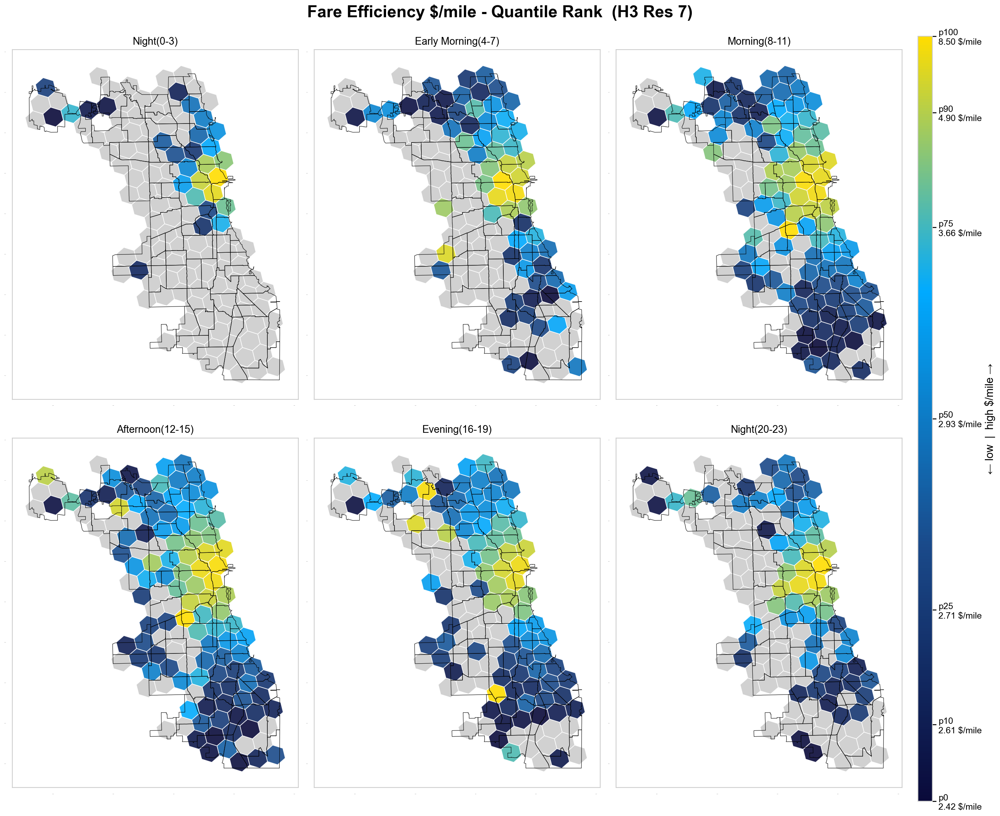

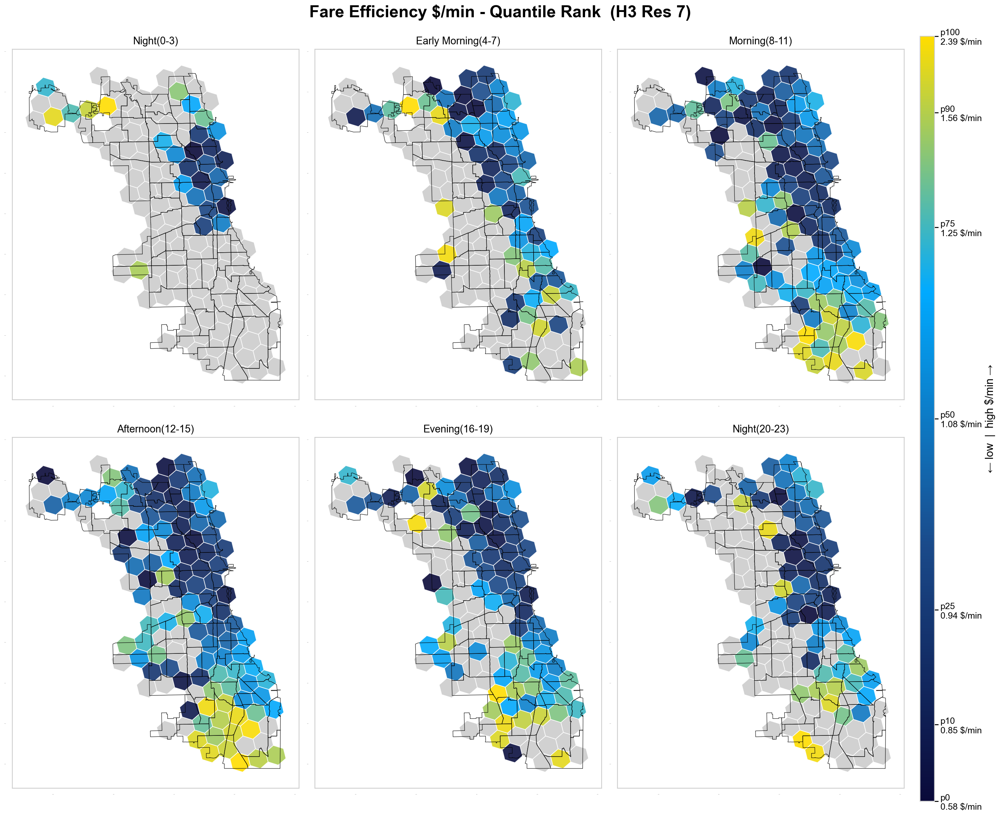

In [197]:
effic_cmap = LinearSegmentedColormap.from_list('effic_qr', ['#0a0a3a', '#1a4a8a', '#00aaff', '#ffdd00'])
matplotlib.colormaps.register(effic_cmap, name='effic_qr', force=True)

for rank_col, val_col, unit_label in [
        ('rank_mile', 'fare_per_mile', '$/mile'),
        ('rank_min',  'fare_per_min',  '$/min')]:

    fig, axes_flat, cbar_ax = make_bucket_figure(
        len(buckets), ncols=3,
        title=f'Fare Efficiency {unit_label} - Quantile Rank  (H3 Res {PLOT_RES})')

    for ax, bucket in zip(axes_flat, buckets):
        sub = kpi_hex[kpi_hex['bucket_4h'] == bucket]
        plot_hex_bucket_linear(ax, h3_grids[PLOT_RES], sub,
                               value_col=rank_col, h3_id_col='h3_id',
                               vmax=1.0, title=bucket, cmap_name='effic_qr',
                               zero_color=mcolors.to_hex(effic_cmap(0.0)))
    for ax in axes_flat[len(buckets):]:
        ax.set_visible(False)

    sm = plt.cm.ScalarMappable(cmap=effic_cmap, norm=plt.Normalize(0, 1))
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax)
    cbar.set_label(f'← low  |  high {unit_label} →', color=TEXT_COLOR, fontsize=17)

    quantile_vals = kpi_hex[val_col].quantile([0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0])
    ticks         = [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    tick_labels   = [f'p{int(q*100)}\n{quantile_vals[q]:.2f} {unit_label}' for q in ticks]
    cbar.set_ticks(ticks)
    cbar.set_ticklabels(tick_labels)
    plt.setp(cbar.ax.yaxis.get_ticklabels(), color=TEXT_COLOR, fontsize=14)
    cbar.ax.tick_params(length=6, width=1.5)

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f'fare_efficiency_{rank_col}_4h.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
    plt.show()

Splitting profit rate into its two components explains the pattern above. Fare per mile is consistently highest downtown across every time bucket: short, congested trips still charge close to the flag-drop fare, so revenue per mile stays high. Fare per minute tells the opposite story, running highest on the South Side and near the city's edges, where trips move faster and cover more ground per minute. Downtown wins on the per-mile metric but loses on the per-minute one, and since profit rate is measured per hour, the per-minute effect dominates. That is exactly why downtown showed up as the least profitable area in the map above.

#### KDE and GMM Hotspot Detection

The choropleths above aggregate demand onto the H3 grid, which works well for the forecasting notebooks but still discretizes the city into an arbitrary hexagon size. As a resolution-independent complement, we fit two classic density-based methods directly on the raw pickup coordinates:

- **KDE (Kernel Density Estimation):** a smooth, continuous density surface over the city, useful for seeing the overall shape of demand without any grid artifacts.
- **GMM (Gaussian Mixture Model):** a small number of elliptical clusters fit on the same coordinates, with the number of clusters chosen by BIC. This gives concrete hotspot centers rather than a continuous surface, which is easier to summarize.

Both are fit on a random subsample of 50,000 pickups to keep runtime reasonable.## KDE and GMM Hotspot Detection

The choropleths above aggregate demand onto the H3 grid, which works well for the forecasting notebooks but still discretizes the city into an arbitrary hexagon size. As a resolution-independent complement, we fit two classic density-based methods directly on the raw pickup coordinates:

- **KDE (Kernel Density Estimation):** a smooth, continuous density surface over the city, useful for seeing the overall shape of demand without any grid artifacts.
- **GMM (Gaussian Mixture Model):** a small number of elliptical clusters fit on the same coordinates, with the number of clusters chosen by BIC. This gives concrete hotspot centers rather than a continuous surface, which is easier to summarize.

Both are fit on a random subsample of 50,000 pickups to keep runtime reasonable.

Optimal GMM components (BIC): 4


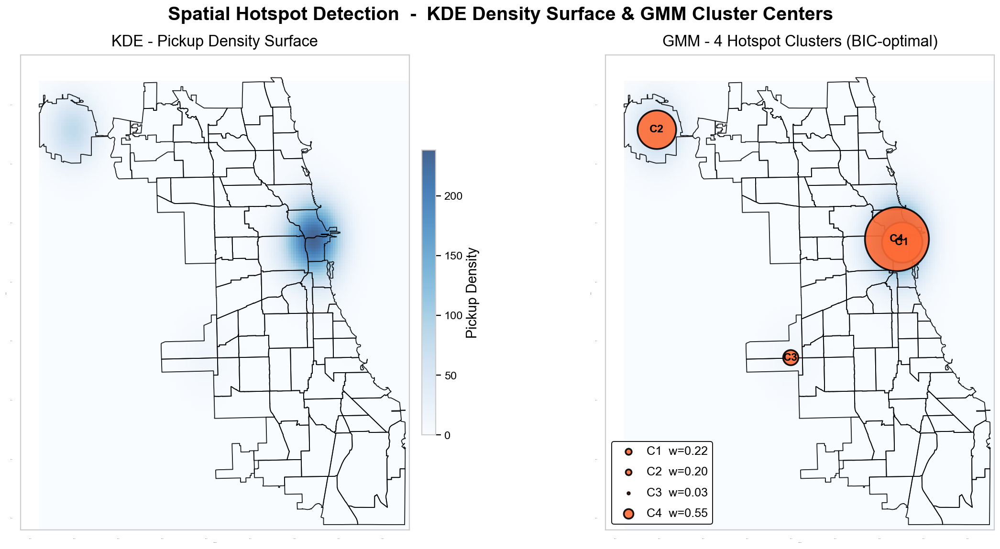

Figure saved ✓


In [198]:
from sklearn.neighbors import KernelDensity
from sklearn.mixture import GaussianMixture

coords = df_demand[['pickup_centroid_latitude', 'pickup_centroid_longitude']].dropna().values
if len(coords) > 50_000:
    idx           = np.random.choice(len(coords), 50_000, replace=False)
    coords_sample = coords[idx]
else:
    coords_sample = coords

kde = KernelDensity(kernel='gaussian', bandwidth=0.02).fit(coords_sample)

lat_min, lat_max = 41.64, 42.02
lng_min, lng_max = -87.94, -87.52
g_lng, g_lat = np.meshgrid(np.linspace(lng_min, lng_max, 150),
                            np.linspace(lat_min, lat_max, 150))
grid_pts = np.column_stack([g_lat.ravel(), g_lng.ravel()])
density  = np.exp(kde.score_samples(grid_pts)).reshape(150, 150)

bics   = [GaussianMixture(n, covariance_type='full', random_state=42).fit(coords_sample).bic(coords_sample)
          for n in range(2, 5)]
best_n = range(2, 9)[np.argmin(bics)]
gmm    = GaussianMixture(best_n, covariance_type='full', random_state=42).fit(coords_sample)
print(f"Optimal GMM components (BIC): {best_n}")

fig, axes = plt.subplots(1, 2, figsize=(20, 9), facecolor=BG_COLOR)
fig.suptitle('Spatial Hotspot Detection  -  KDE Density Surface & GMM Cluster Centers',
             fontsize=22, fontweight='bold', color=TEXT_COLOR)

for ax in axes:
    ax.set_facecolor(FIG_COLOR)
    ax.grid(False)
    ax.imshow(density, origin='lower',
              extent=[lng_min, lng_max, lat_min, lat_max],
              cmap='Blues', aspect='auto', alpha=0.75)
    gdf_communities.boundary.plot(ax=ax, color=BORDER_COLOR, linewidth=1.0, alpha=0.9)
    ax.tick_params(colors=TEXT_COLOR, labelsize=0)
    ax.set_xlabel('Longitude', fontsize=0)
    ax.set_ylabel('Latitude',  fontsize=0)

cbar = plt.colorbar(axes[0].images[0], ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Pickup Density', color=TEXT_COLOR, fontsize=16)
plt.setp(cbar.ax.yaxis.get_ticklabels(), color=TEXT_COLOR, fontsize=13)
axes[0].set_title('KDE - Pickup Density Surface', fontsize=18, color=TEXT_COLOR, pad=10)

axes[1].set_title(f'GMM - {best_n} Hotspot Clusters (BIC-optimal)', fontsize=18, color=TEXT_COLOR, pad=10)
for i, (center, weight) in enumerate(zip(gmm.means_, gmm.weights_)):
    axes[1].scatter(center[1], center[0], s=weight * 10000,
                    color='#ff6b35', edgecolors='black', linewidths=2,
                    zorder=5, alpha=0.9, label=f'C{i+1}  w={weight:.2f}')
    axes[1].annotate(f'C{i+1}', xy=(center[1], center[0]),
                     fontsize=13, color='black', fontweight='bold',
                     ha='center', va='center', zorder=6)
axes[1].legend(fontsize=14, facecolor=FIG_COLOR, labelcolor=TEXT_COLOR,
               edgecolor=BORDER_COLOR, loc='lower left', framealpha=1.0,
               markerscale=0.15, handletextpad=0.5, labelspacing=0.8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'kde_gmm_hotspots.png', dpi=150, bbox_inches='tight', pad_inches=0.5)
plt.show()
print('Figure saved ✓')

BIC settles on 4 clusters. Two of them sit almost on top of each other in the downtown/lakefront corridor and together carry the largest share of the mixture weight, essentially splitting the same hotspot the choropleths already pointed to. One cluster lands on O'Hare, and another is a small, low-weight cluster near Midway. The KDE surface tells the same story more smoothly: a sharp, strong density peak downtown and a much softer bump over O'Hare, with the rest of the city close to flat. KDE and GMM agree with the H3-based choropleths from earlier: Chicago taxi demand is structurally dominated by one hub (downtown/lakefront) plus the two airports, rather than being spread evenly across neighborhoods.

*Note: `coords_sample` is drawn without a fixed seed, so exact cluster composition and weights may vary slightly between runs — the specific figures above reflect one particular run.*